# **Importing necessary libraries**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn

In [ ]:
import chart_studio.plotly as py
import cufflinks as cf
import seaborn as sns
import plotly.express as px
import plotly.io as pio
%matplotlib inline
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
pio.renderers.default = "notebook"
cf.go_offline()

In [ ]:
pd.set_option("display.max_columns",None)

# **Exploring Data**

In [ ]:
df = pd.read_csv("fraud_oracle.csv")

In [ ]:
df.head()

,Month,WeekOfMonth,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Sex,MaritalStatus,Age,Fault,PolicyType,VehicleCategory,VehiclePrice,FraudFound_P,PolicyNumber,RepNumber,Deductible,DriverRating,Days_Policy_Accident,Days_Policy_Claim,PastNumberOfClaims,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy
0,Dec,5,Wednesday,Honda,Urban,Tuesday,Jan,1,Female,Single,21,Policy Holder,Sport - Liability,Sport,more than 69000,0,1,12,300,1,more than 30,more than 30,none,3 years,26 to 30,No,No,External,none,1 year,3 to 4,1994,Liability
1,Jan,3,Wednesday,Honda,Urban,Monday,Jan,4,Male,Single,34,Policy Holder,Sport - Collision,Sport,more than 69000,0,2,15,400,4,more than 30,more than 30,none,6 years,31 to 35,Yes,No,External,none,no change,1 vehicle,1994,Collision
2,Oct,5,Friday,Honda,Urban,Thursday,Nov,2,Male,Married,47,Policy Holder,Sport - Collision,Sport,more than 69000,0,3,7,400,3,more than 30,more than 30,1,7 years,41 to 50,No,No,External,none,no change,1 vehicle,1994,Collision
3,Jun,2,Saturday,Toyota,Rural,Friday,Jul,1,Male,Married,65,Third Party,Sedan - Liability,Sport,20000 to 29000,0,4,4,400,2,more than 30,more than 30,1,more than 7,51 to 65,Yes,No,External,more than 5,no change,1 vehicle,1994,Liability
4,Jan,5,Monday,Honda,Urban,Tuesday,Feb,2,Female,Single,27,Third Party,Sport - Collision,Sport,more than 69000,0,5,3,400,1,more than 30,more than 30,none,5 years,31 to 35,No,No,External,none,no change,1 vehicle,1994,Collision


In [ ]:
df.columns

Index(['Month', 'WeekOfMonth', 'DayOfWeek', 'Make', 'AccidentArea',
       'DayOfWeekClaimed', 'MonthClaimed', 'WeekOfMonthClaimed', 'Sex',
       'MaritalStatus', 'Age', 'Fault', 'PolicyType', 'VehicleCategory',
       'VehiclePrice', 'FraudFound_P', 'PolicyNumber', 'RepNumber',
       'Deductible', 'DriverRating', 'Days_Policy_Accident',
       'Days_Policy_Claim', 'PastNumberOfClaims', 'AgeOfVehicle',
       'AgeOfPolicyHolder', 'PoliceReportFiled', 'WitnessPresent', 'AgentType',
       'NumberOfSuppliments', 'AddressChange_Claim', 'NumberOfCars', 'Year',
       'BasePolicy'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15420 entries, 0 to 15419
Data columns (total 33 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Month                 15420 non-null  object
 1   WeekOfMonth           15420 non-null  int64 
 2   DayOfWeek             15420 non-null  object
 3   Make                  15420 non-null  object
 4   AccidentArea          15420 non-null  object
 5   DayOfWeekClaimed      15420 non-null  object
 6   MonthClaimed          15420 non-null  object
 7   WeekOfMonthClaimed    15420 non-null  int64 
 8   Sex                   15420 non-null  object
 9   MaritalStatus         15420 non-null  object
 10  Age                   15420 non-null  int64 
 11  Fault                 15420 non-null  object
 12  PolicyType            15420 non-null  object
 13  VehicleCategory       15420 non-null  object
 14  VehiclePrice          15420 non-null  object
 15  FraudFound_P          15420 non-null

There are 32 columns with 15420 entries in each

In [ ]:
df.describe()

,WeekOfMonth,WeekOfMonthClaimed,Age,FraudFound_P,PolicyNumber,RepNumber,Deductible,DriverRating,Year
count,15420.000000,15420.000000,15420.000000,15420.000000,15420.000000,15420.000000,15420.000000,15420.000000,15420.000000
mean,2.788586,2.693969,39.855707,0.059857,7710.500000,8.483268,407.704280,2.487808,1994.866472
std,1.287585,1.259115,13.492377,0.237230,4451.514911,4.599948,43.950998,1.119453,0.803313
min,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,300.000000,1.000000,1994.000000
25%,2.000000,2.000000,31.000000,0.000000,3855.750000,5.000000,400.000000,1.000000,1994.000000
50%,3.000000,3.000000,38.000000,0.000000,7710.500000,8.000000,400.000000,2.000000,1995.000000
75%,4.000000,4.000000,48.000000,0.000000,11565.250000,12.000000,400.000000,3.000000,1996.000000
max,5.000000,5.000000,80.000000,1.000000,15420.000000,16.000000,700.000000,4.000000,1996.000000


In [ ]:
df.describe(include="object")

,Month,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,Sex,MaritalStatus,Fault,PolicyType,VehicleCategory,VehiclePrice,Days_Policy_Accident,Days_Policy_Claim,PastNumberOfClaims,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,BasePolicy
count,15420,15420,15420,15420,15420,15420,15420,15420,15420,15420,15420,15420,15420,15420,15420,15420,15420,15420,15420,15420,15420,15420,15420,15420
unique,12,7,19,2,8,13,2,4,2,9,3,6,5,4,4,8,9,2,2,2,4,5,5,3
top,Jan,Monday,Pontiac,Urban,Monday,Jan,Male,Married,Policy Holder,Sedan - Collision,Sedan,20000 to 29000,more than 30,more than 30,2 to 4,7 years,31 to 35,No,No,External,none,no change,1 vehicle,Collision
freq,1411,2616,3837,13822,3757,1446,13000,10625,11230,5584,9671,8079,15247,15342,5485,5807,5593,14992,15333,15179,7047,14324,14316,5962


In [ ]:
df.isnull().sum()

Month                   0
WeekOfMonth             0
DayOfWeek               0
Make                    0
AccidentArea            0
DayOfWeekClaimed        0
MonthClaimed            0
WeekOfMonthClaimed      0
Sex                     0
MaritalStatus           0
Age                     0
Fault                   0
PolicyType              0
VehicleCategory         0
VehiclePrice            0
FraudFound_P            0
PolicyNumber            0
RepNumber               0
Deductible              0
DriverRating            0
Days_Policy_Accident    0
Days_Policy_Claim       0
PastNumberOfClaims      0
AgeOfVehicle            0
AgeOfPolicyHolder       0
PoliceReportFiled       0
WitnessPresent          0
AgentType               0
NumberOfSuppliments     0
AddressChange_Claim     0
NumberOfCars            0
Year                    0
BasePolicy              0
dtype: int64

In [ ]:
df.duplicated().sum()

0

No null and duplicated values found

In [ ]:
df["FraudFound_P"].value_counts()

0    14497
1      923
Name: FraudFound_P, dtype: int64

The FraudFound_P indicates whether the insured person committed a fraud or not


1.   O indicates no fraud
2.   1 indicates fraud
Here 923 people committed fraud of 15420 people indicating a imbalance dataset

Now we will look at the distribution of features

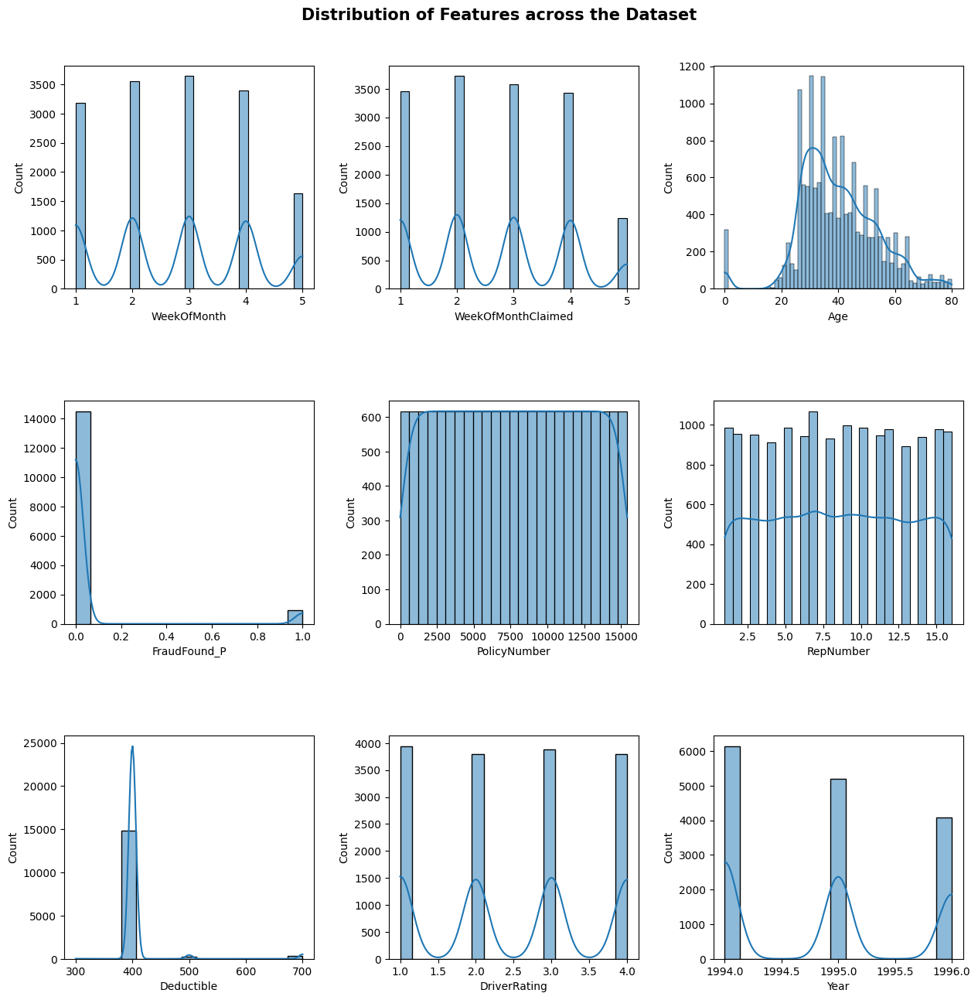

In [ ]:
fig, ax = plt.subplots(3, 3, figsize=(15, 15), gridspec_kw={"hspace": 0.5, "wspace": 0.3})
for i, col in enumerate(df.select_dtypes(include=["int64","float64"])):
    sns.histplot(x=df[col],kde=True,ax=ax[i//3, i%3])

fig.suptitle('Distribution of Features across the Dataset', fontsize=15, fontweight='bold', y=0.93)


plt.show()

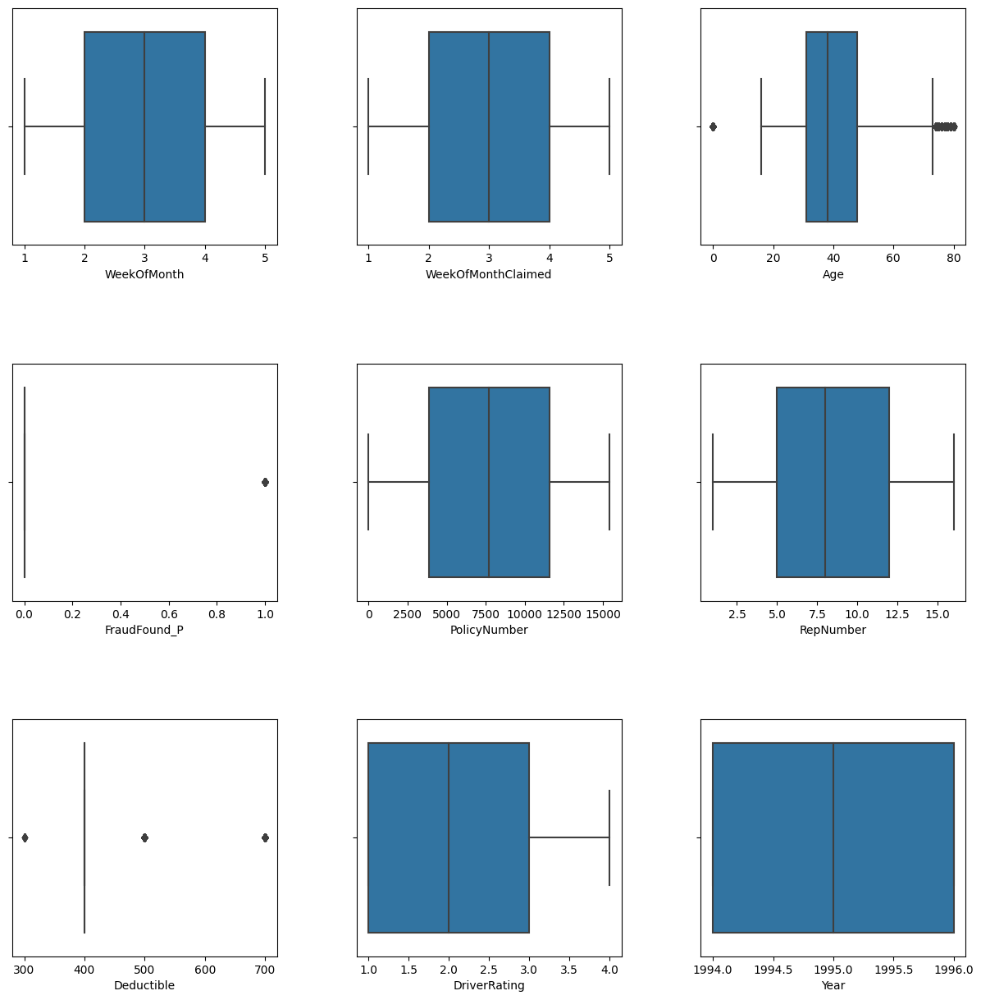

In [ ]:
fig, ax = plt.subplots(3, 3, figsize=(15, 15), gridspec_kw={"hspace": 0.5, "wspace": 0.3})
for i, col in enumerate(df.select_dtypes(include=["int64","float64"])):
    sns.boxplot(x=df[col],ax=ax[i//3, i%3])

The Boxplot shows large number of outliers in the Age column

In [ ]:
df[df["Age"]<18]["Age"].value_counts()

0     320
16      9
17      6
Name: Age, dtype: int64

320 people have their Ages recorded as 0 which might be due to wrong data entry so I am removing these outliers

In [ ]:
df[df["Age"]>70]["Age"].value_counts()

72    45
76    42
71    40
74    35
78    35
75    34
80    32
73    32
77    29
79    20
Name: Age, dtype: int64

In [ ]:
df = df[df["Age"]>15]

In [ ]:
df[df["Age"]<18]["Age"].value_counts()

16    9
17    6
Name: Age, dtype: int64

In [ ]:
num_cols = df.select_dtypes(include=["int64","float64"])
cat_cols = df.select_dtypes(include=["object"])

In [ ]:
cat_cols.columns

Index(['Month', 'DayOfWeek', 'Make', 'AccidentArea', 'DayOfWeekClaimed',
       'MonthClaimed', 'Sex', 'MaritalStatus', 'Fault', 'PolicyType',
       'VehicleCategory', 'VehiclePrice', 'Days_Policy_Accident',
       'Days_Policy_Claim', 'PastNumberOfClaims', 'AgeOfVehicle',
       'AgeOfPolicyHolder', 'PoliceReportFiled', 'WitnessPresent', 'AgentType',
       'NumberOfSuppliments', 'AddressChange_Claim', 'NumberOfCars',
       'BasePolicy'],
      dtype='object')

# Univariate Analysis of Categorical Columns

In [ ]:
px.histogram(df,x="Month",color="Month")

In [ ]:
px.histogram(cat_cols,x="DayOfWeek",color="DayOfWeek")

In [ ]:
px.histogram(cat_cols,x="Make",color="Make")

In [ ]:
px.histogram(cat_cols,x="AccidentArea",color="AccidentArea")

In [ ]:
px.histogram(cat_cols,x="DayOfWeekClaimed",color="DayOfWeekClaimed")

In [ ]:
px.histogram(cat_cols,x="MonthClaimed",color="MonthClaimed")

In [ ]:
px.histogram(cat_cols,x="Sex",color="Sex")

In [ ]:
px.histogram(cat_cols,x="MaritalStatus",color="MaritalStatus")

In [ ]:
px.histogram(cat_cols,x="Fault",color="Fault")

In [ ]:
px.histogram(cat_cols,x="PolicyType",color="PolicyType")

In [ ]:
px.histogram(cat_cols,x="VehicleCategory",color="VehicleCategory")

In [ ]:
px.histogram(cat_cols,x="VehiclePrice",color="VehiclePrice")

In [ ]:
px.histogram(cat_cols,x="Days_Policy_Accident",color="Days_Policy_Accident")

In [ ]:
px.histogram(cat_cols,x="Days_Policy_Claim",color="Days_Policy_Claim")

In [ ]:
px.histogram(cat_cols,x="PastNumberOfClaims",color="PastNumberOfClaims")

In [ ]:
px.histogram(cat_cols,x="AgeOfVehicle",color="AgeOfVehicle")

In [ ]:
px.histogram(cat_cols,x="PoliceReportFiled",color="PoliceReportFiled")

In [ ]:
px.histogram(cat_cols,x="WitnessPresent",color="WitnessPresent")

In [ ]:
px.histogram(cat_cols,x="AgentType",color="AgentType")

In [ ]:
px.histogram(cat_cols,x="NumberOfSuppliments",color="NumberOfSuppliments")

In [ ]:
px.histogram(cat_cols,x="AddressChange_Claim",color="AddressChange_Claim")

In [ ]:
px.histogram(cat_cols,x="NumberOfCars",color="NumberOfCars")

In [ ]:
px.histogram(cat_cols,x="BasePolicy",color="BasePolicy")

# **Observations From the Above Graphs** :
1. All the Months had almost same number of Claims Filed.
2. Pontiac owners filed the most number of Claims.
3. Most of the accidents happened in Urban Area.
4. Most of the people who claimed were Male and Married.
5. Mostly the Policy holders were at fault for the Accidents.
6. Sedan was the most used car and Collision was the base policy for most of the claims filed.
7. Most of the cars were priced in the range 20000 - 29000.
8. Most people filed claims more than 30 days after the accident and it generally took more than 30 days to settle the claim.
9. Most of the Cars in which accident took place were older than 6 years.
10. In most of the cases No Police report was filed and No Witness was found.
11. Most claimers had no supplements but a large number of claimers had more than 5 supplements.

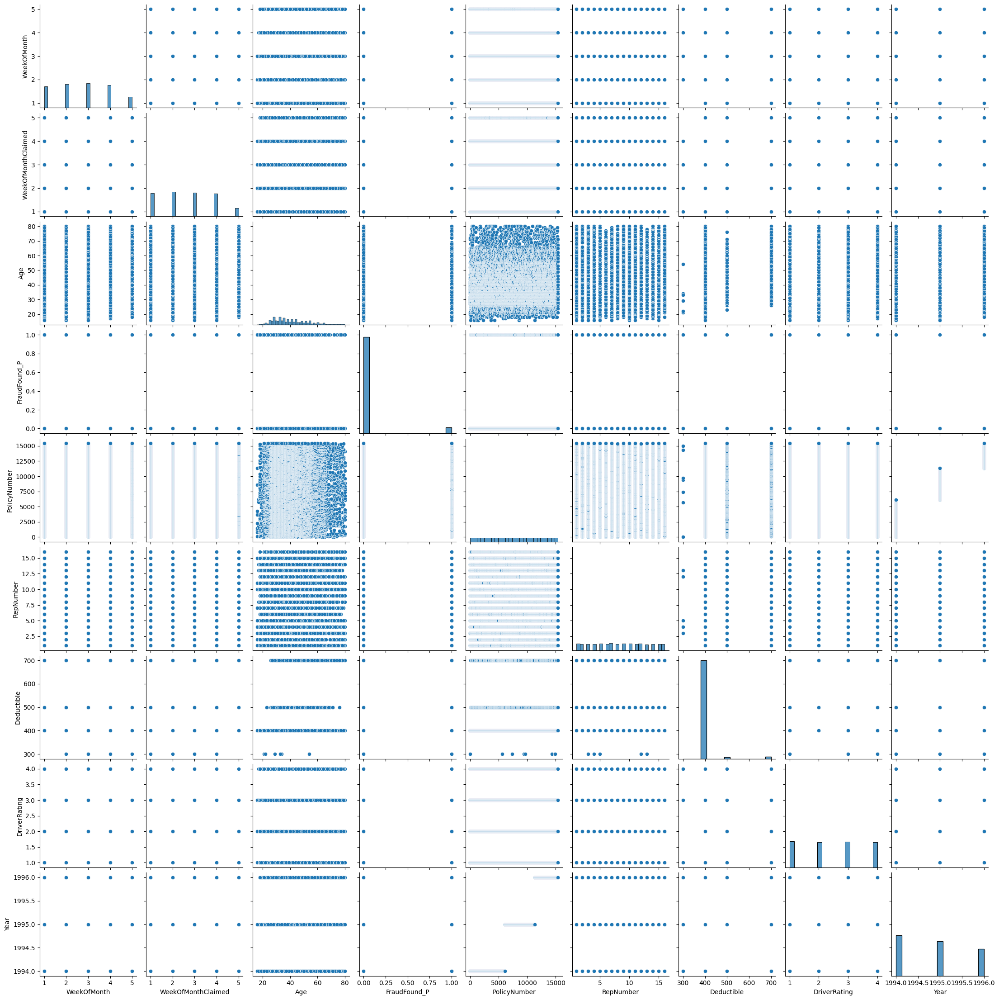

In [ ]:
sns.pairplot(num_cols)

In [ ]:
pd.crosstab(df["FraudFound_P"],df["Month"])

Month,Apr,Aug,Dec,Feb,Jan,Jul,Jun,Mar,May,Nov,Oct,Sep
FraudFound_P,,,,,,,,,,,,
0,1161,1039,1200,1142,1268,1183,1219,1217,1245,1144,1231,1159
1,74,83,59,77,84,58,78,96,91,46,70,76


In [ ]:
pd.crosstab(df["FraudFound_P"],df["MonthClaimed"])

MonthClaimed,Apr,Aug,Dec,Feb,Jan,Jul,Jun,Mar,May,Nov,Oct,Sep
FraudFound_P,,,,,,,,,,,,
0,1139,1027,1091,1167,1287,1160,1195,1208,1279,1230,1264,1161
1,78,91,48,73,88,56,76,90,97,46,73,76


In [ ]:
pd.crosstab(df["FraudFound_P"],df["DayOfWeek"])

DayOfWeek,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
FraudFound_P,,,,,,,
0,2245,2389,1820,1591,2017,2147,1999
1,147,158,125,119,119,115,109


In [ ]:
pd.crosstab(df["FraudFound_P"],df["DayOfWeekClaimed"])

DayOfWeekClaimed,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
FraudFound_P,,,,,,,
0,2276,3473,117,49,2475,3112,2706
1,158,211,10,3,141,185,184


Most of the months had around same number of accidents and claims filed and
there wasn't a large difference in the number of frauds found in different months, same for Day of Week except for Saturdays and Sundays where the claims filed were very less as they are weekends.

In [ ]:
pd.crosstab(df["VehicleCategory"],df["VehiclePrice"])

VehiclePrice,20000 to 29000,30000 to 39000,40000 to 59000,60000 to 69000,less than 20000,more than 69000
VehicleCategory,,,,,,
Sedan,5435,2043,237,42,1009,744
Sport,2643,1480,183,43,86,773
Utility,1,9,41,2,0,329


In [ ]:
pd.crosstab(df["VehicleCategory"],columns=[df["VehiclePrice"],df["BasePolicy"]],margins=True)

VehiclePrice    20000 to 29000                     30000 to 39000            \
BasePolicy          All Perils Collision Liability     All Perils Collision   
VehicleCategory                                                               
Sedan                     2061      3374         0            657      1386   
Sport                        6         0      2637              3         0   
Utility                      0         1         0              9         0   
All                       2067      3375      2637            669      1386   

VehiclePrice              40000 to 59000                     60000 to 69000  \
BasePolicy      Liability     All Perils Collision Liability     All Perils   
VehicleCategory                                                               
Sedan                   0             78       159         0             19   
Sport                1477              0         0       183              1   
Utility                 0             35         4         2              2   
All                  1477            113       163       185             22   

VehiclePrice                        less than 20000                      \
BasePolicy      Collision Liability      All Perils Collision Liability   
VehicleCategory                                                           
Sedan                  23         0             763       246         0   
Sport                   0        42               3         0        83   
Utility                 0         0               0         0         0   
All                    23        42             766       246        83   

VehiclePrice    more than 69000                        All  
BasePolicy           All Perils Collision Liability         
VehicleCategory                                             
Sedan                       412       332         0   9510  
Sport                         1       344       428   5208  
Utility                     286        25        18    382  
All                         699       701       446  15100

In [ ]:
pd.crosstab(df["AccidentArea"],df["VehicleCategory"])

VehicleCategory,Sedan,Sport,Utility
AccidentArea,,,
Rural,1097,394,55
Urban,8413,4814,327


1. Most Utility Cars were expensive and priced at more than 69000 and All Perils insurance policy. They also had large number of accidents in Rural Area.
2. Most Sports cars had liability insurance policy.
3. Most Sedan cars had collision insurance policy.

In [ ]:
pd.crosstab(df["PoliceReportFiled"],df["WitnessPresent"])

WitnessPresent,No,Yes
PoliceReportFiled,,
No,14636,45
Yes,379,40


Claims in which Police Report was filed had more Witness Present compared to those in which Police report was not filed

In [ ]:
pd.crosstab(df["FraudFound_P"],df["Make"])

Make,Accura,BMW,Chevrolet,Dodge,Ferrari,Ford,Honda,Jaguar,Lexus,Mazda,Mecedes,Mercury,Nisson,Pontiac,Porche,Saab,Saturn,Toyota,VW
FraudFound_P,,,,,,,,,,,,,,,,,,,
0,413,14,1587,106,2,417,2334,6,1,2231,3,77,29,3624,5,97,52,2935,275
1,59,1,94,2,0,33,148,0,0,123,1,6,1,213,0,11,6,186,8


<Axes: xlabel='Make', ylabel='VehiclePrice'>

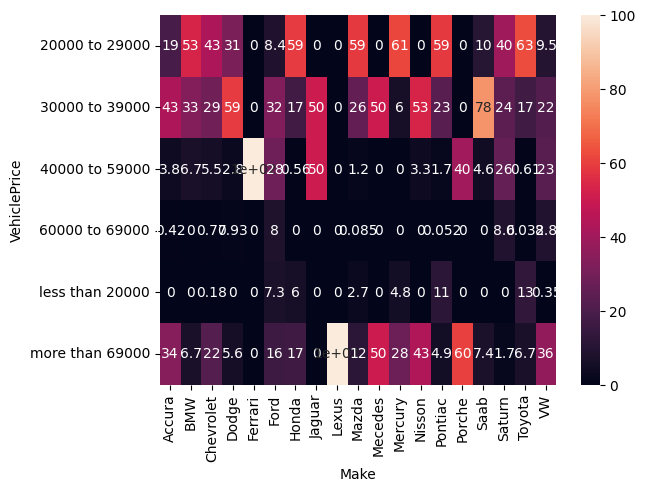

In [ ]:
sns.heatmap(pd.crosstab(df["VehiclePrice"],df["Make"],normalize="columns")*100,annot=True)

In [ ]:
pd.crosstab(df["FraudFound_P"],df["VehiclePrice"],margins=True)

VehiclePrice,20000 to 29000,30000 to 39000,40000 to 59000,60000 to 69000,less than 20000,more than 69000,All
FraudFound_P,,,,,,,
0,7658,3357,430,83,992,1688,14208
1,421,175,31,4,103,158,892
All,8079,3532,461,87,1095,1846,15100


<Axes: xlabel='VehiclePrice', ylabel='FraudFound_P'>

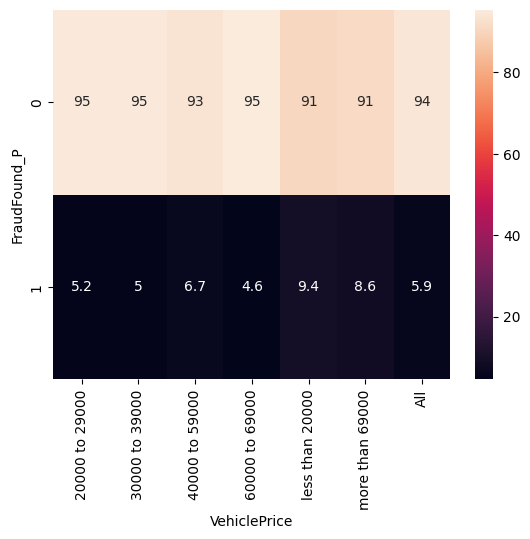

In [ ]:
sns.heatmap(pd.crosstab(df["FraudFound_P"],df["VehiclePrice"],normalize="columns",margins=True)*100,annot=True)

In [ ]:
pd.crosstab(df["FraudFound_P"],columns=[df["Make"],df["VehiclePrice"]],margins=True)

Make                 Accura                                               \
VehiclePrice 20000 to 29000 30000 to 39000 40000 to 59000 60000 to 69000   
FraudFound_P                                                               
0                        84            184             14              2   
1                         6             18              4              0   
All                      90            202             18              2   

Make                                    BMW                                \
VehiclePrice more than 69000 20000 to 29000 30000 to 39000 40000 to 59000   
FraudFound_P                                                                
0                        129              7              5              1   
1                         31              1              0              0   
All                      160              8              5              1   

Make                              Chevrolet                                \
VehiclePrice more than 69000 20000 to 29000 30000 to 39000 40000 to 59000   
FraudFound_P                                                                
0                          1            682            457             91   
1                          0             39             23              1   
All                        1            721            480             92   

Make                                                                 Dodge  \
VehiclePrice 60000 to 69000 less than 20000 more than 69000 20000 to 29000   
FraudFound_P                                                                 
0                        12               3             342             33   
1                         1               0              30              1   
All                      13               3             372             34   

Make                                                                       \
VehiclePrice 30000 to 39000 40000 to 59000 60000 to 69000 more than 69000   
FraudFound_P                                                                
0                        63              3              1               6   
1                         1              0              0               0   
All                      64              3              1               6   

Make                Ferrari           Ford                                \
VehiclePrice 40000 to 59000 20000 to 29000 30000 to 39000 40000 to 59000   
FraudFound_P                                                               
0                         2             29            144            114   
1                         0              9              1             13   
All                       2             38            145            127   

Make                                                                 Honda  \
VehiclePrice 60000 to 69000 less than 20000 more than 69000 20000 to 29000   
FraudFound_P                                                                 
0                        36              29              65           1408   
1                         0               4               6             63   
All                      36              33              71           1471   

Make                                                                        \
VehiclePrice 30000 to 39000 40000 to 59000 less than 20000 more than 69000   
FraudFound_P                                                                 
0                       406             13             139             368   
1                        26              1              11              47   
All                     432             14             150             415   

Make                 Jaguar                          Lexus          Mazda  \
VehiclePrice 30000 to 39000 40000 to 59000 more than 69000 20000 to 29000   
FraudFound_P                                                                
0                         3              3               1 

<Axes: xlabel='Make-VehiclePrice', ylabel='FraudFound_P'>

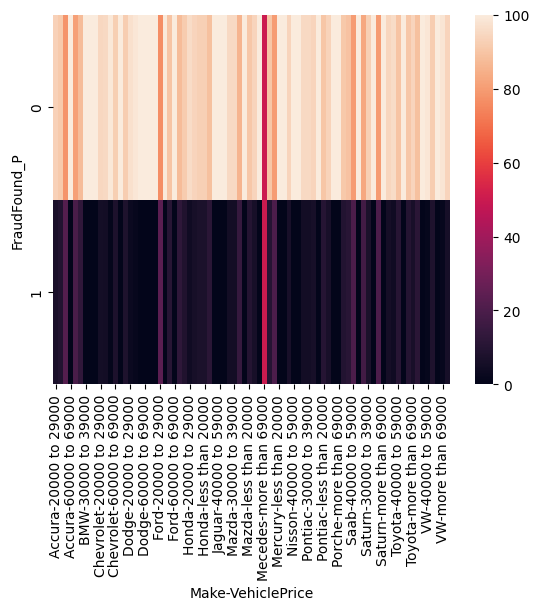

In [ ]:
sns.heatmap(pd.crosstab(df["FraudFound_P"],columns=[df["Make"],df["VehiclePrice"]],normalize="columns",margins=True)*100)

1. Cars from Accura had large percentage of frauds compared to other brands and most of their cars in which fraud was found were priced more than 69000.
2. Cars priced at less than 20000 and more than 69000 had large percentage of frauds in comparision to other price ranges.
3. Ford cars also had large percentage of frauds compared to other brands.

In [ ]:
pd.crosstab(df["FraudFound_P"],df["AgeOfVehicle"])

AgeOfVehicle,2 years,3 years,4 years,5 years,6 years,7 years,more than 7,new
FraudFound_P,,,,,,,,
0,70,138,208,1262,3220,5482,3774,54
1,3,13,21,95,228,325,206,1


<Axes: xlabel='AgeOfVehicle', ylabel='FraudFound_P'>

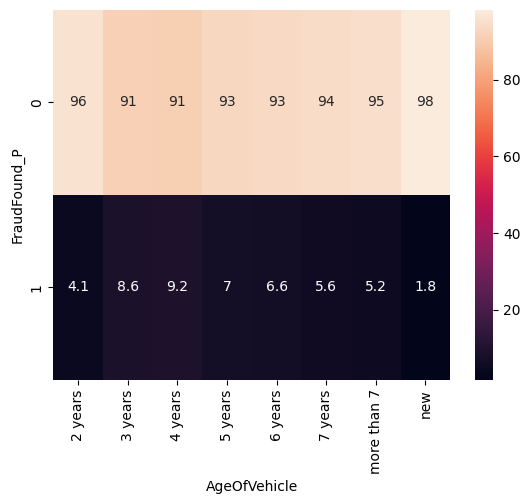

In [ ]:
sns.heatmap(pd.crosstab(df["FraudFound_P"],df["AgeOfVehicle"],normalize="columns")*100,annot=True)

1. Most of the Cars are 7 years old so most of the frauds were found in 7 year old cars.
2. Cars 4 years old though very less in number had very large percentage of frauds.

In [ ]:
pd.crosstab(df["FraudFound_P"],df["PastNumberOfClaims"])

PastNumberOfClaims,1,2 to 4,more than 4,none
FraudFound_P,,,,
0,3292,5088,1904,3924
1,217,290,66,319


In [ ]:
pd.crosstab(df["FraudFound_P"],df["PastNumberOfClaims"],normalize="columns")*100

PastNumberOfClaims,1,2 to 4,more than 4,none
FraudFound_P,,,,
0,93.815902,94.607661,96.649746,92.481735
1,6.184098,5.392339,3.350254,7.518265


In [ ]:
pd.crosstab(df["FraudFound_P"],df["PoliceReportFiled"])

PoliceReportFiled,No,Yes
FraudFound_P,,
0,13804,404
1,877,15


In [ ]:
pd.crosstab(df["FraudFound_P"],df["WitnessPresent"])

WitnessPresent,No,Yes
FraudFound_P,,
0,14126,82
1,889,3


1. Most of the fraudsters had no past claims.
2. In most cases no police reports were filed and no witnesses were present.

In [ ]:
pd.crosstab(df["FraudFound_P"],df["AccidentArea"])

AccidentArea,Rural,Urban
FraudFound_P,,
0,1415,12793
1,131,761


Most of the accidents were in urban area but rural area had a large percentage of frauds in comparision to urban area

In [ ]:
pd.crosstab(df["FraudFound_P"],df["VehicleCategory"])

VehicleCategory,Sedan,Sport,Utility
FraudFound_P,,,
0,8743,5125,340
1,767,83,42


<Axes: xlabel='VehicleCategory', ylabel='FraudFound_P'>

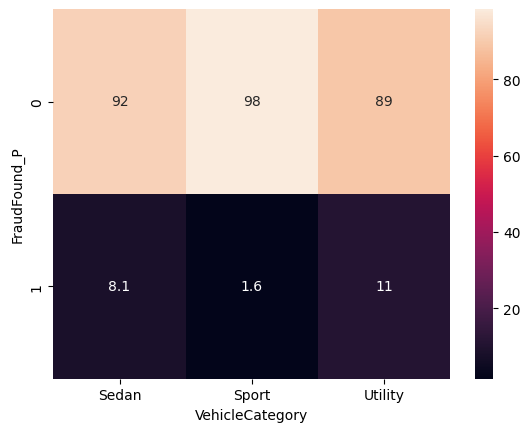

In [ ]:
sns.heatmap(pd.crosstab(df["FraudFound_P"],df["VehicleCategory"],normalize="columns")*100,annot=True)

Most of the vehicles are Sedan cars whereas utility cars are the lowest in number but have a higher proportion of fraud in comparision to other vehicles. This may be due to most utility cars being priced in the range more than 69000 in which a large percentage of frauds were found.

In [ ]:
pd.crosstab(df["FraudFound_P"],df["Days_Policy_Accident"])

Days_Policy_Accident,1 to 7,15 to 30,8 to 15,more than 30,none
FraudFound_P,,,,,
0,13,46,50,14053,46
1,1,3,5,874,9


In [ ]:
pd.crosstab(df["FraudFound_P"],df["Days_Policy_Claim"])

Days_Policy_Claim,15 to 30,8 to 15,more than 30
FraudFound_P,,,
0,50,18,14140
1,6,3,883


In [ ]:
pd.crosstab(df["FraudFound_P"],df["Fault"])

Fault,Policy Holder,Third Party
FraudFound_P,,
0,10097,4111
1,855,37


<Axes: xlabel='Sex', ylabel='FraudFound_P'>

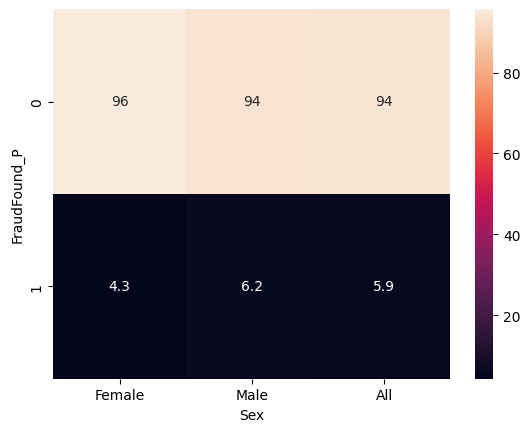

In [ ]:
sns.heatmap(pd.crosstab(df["FraudFound_P"],df["Sex"],normalize="columns",margins=True)*100,annot=True)

There is not a large difference between males and females in terms of frauds found

In [ ]:
pd.crosstab(df["FraudFound_P"],df["BasePolicy"],normalize="columns",margins=True)*100

BasePolicy,All Perils,Collision,Liability,All
FraudFound_P,,,,
0,90.152214,92.704445,99.281314,94.092715
1,9.847786,7.295555,0.718686,5.907285


People with All perils policy committed more percentage of frauds whereas people with liability policy had the lowest number of frauds found.

In [ ]:
pd.crosstab(df["FraudFound_P"],df["AgeOfPolicyHolder"])

AgeOfPolicyHolder,18 to 20,21 to 25,26 to 30,31 to 35,36 to 40,41 to 50,51 to 65,over 65
FraudFound_P,,,,,,,,
0,13,92,580,5233,3806,2684,1322,478
1,2,16,33,360,237,144,70,30


<Axes: xlabel='AgeOfPolicyHolder', ylabel='FraudFound_P'>

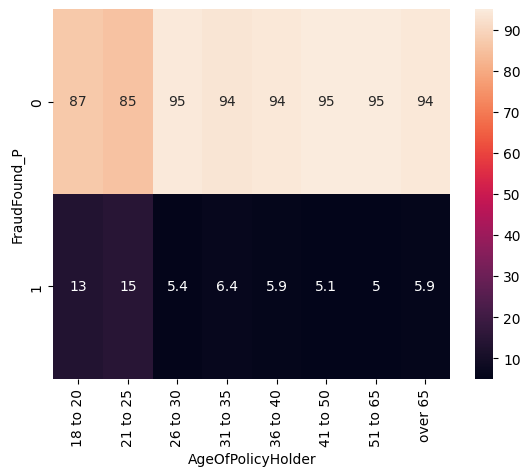

In [ ]:
sns.heatmap(pd.crosstab(df["FraudFound_P"],df["AgeOfPolicyHolder"],normalize="columns")*100,annot=True)

Text(0.5, 1.0, 'Distribution of frauders across age')

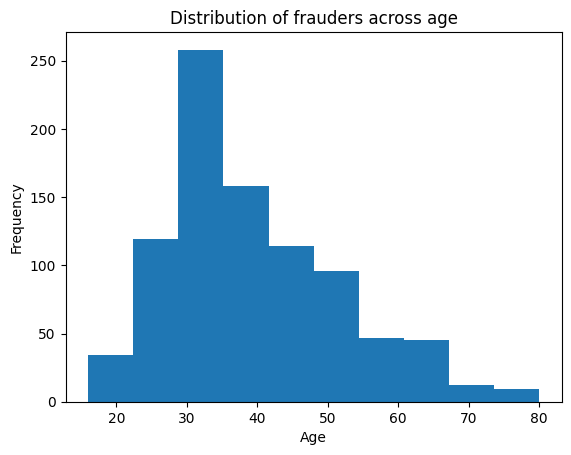

In [ ]:
df[df["FraudFound_P"] == 1]["Age"].plot(kind="hist")
plt.xlabel("Age")
plt.title("Distribution of frauders across age")

Most of the people who filed for claims were between 30 - 35 years old and most frauds were also committed in that age range  

In [ ]:
pd.crosstab(df["FraudFound_P"],df["AddressChange_Claim"])

AddressChange_Claim,1 year,2 to 3 years,4 to 8 years,no change,under 6 months
FraudFound_P,,,,,
0,156,236,585,13230,1
1,10,50,31,798,3


<Axes: xlabel='AddressChange_Claim', ylabel='FraudFound_P'>

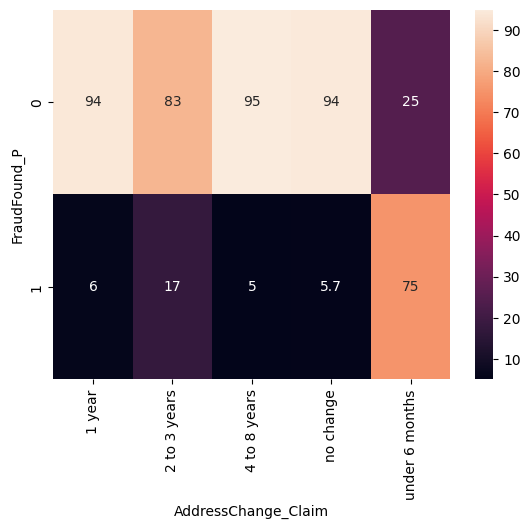

In [ ]:
sns.heatmap(pd.crosstab(df["FraudFound_P"],df["AddressChange_Claim"],normalize="columns")*100,annot=True)

Most people did not change their address but in cases where the person changed his address the percentage of fraud was higher.

In [ ]:
pd.crosstab(df["FraudFound_P"],df["DriverRating"])

DriverRating,1,2,3,4
FraudFound_P,,,,
0,3642,3513,3553,3500
1,224,208,235,225


In [ ]:
pd.crosstab(df["FraudFound_P"],df["NumberOfCars"])

NumberOfCars,1 vehicle,2 vehicles,3 to 4,5 to 8,more than 8
FraudFound_P,,,,,
0,13196,651,339,20,2
1,822,40,29,1,0


In [ ]:
pd.crosstab(df["FraudFound_P"],df["MaritalStatus"])

MaritalStatus,Divorced,Married,Single,Widow
FraudFound_P,,,,
0,73,9986,4117,32
1,3,639,247,3


In [ ]:
pd.crosstab(df["FraudFound_P"],df["Year"],normalize="columns")*100

Year,1994,1995,1996
FraudFound_P,,,
0,93.652915,94.117647,94.717169
1,6.347085,5.882353,5.282831


In [ ]:
pd.crosstab(df["FraudFound_P"],df["AgentType"])

AgentType,External,Internal
FraudFound_P,,
0,13972,236
1,888,4


Driver Rating,Number of Cars,Martial Status,Year had no major effect on the number of frauds found.

In [ ]:
pd.crosstab(df["FraudFound_P"],df["Deductible"])

Deductible,300,400,500,700
FraudFound_P,,,,
0,5,13694,216,293
1,2,825,47,18


Most people who filed claims had 400 as deductible amount in their policy.

# Preprocessing and Model Testing

In [ ]:
df1 = df.copy()

In [ ]:
df1.head()

,Month,WeekOfMonth,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Sex,MaritalStatus,Age,Fault,PolicyType,VehicleCategory,VehiclePrice,FraudFound_P,PolicyNumber,RepNumber,Deductible,DriverRating,Days_Policy_Accident,Days_Policy_Claim,PastNumberOfClaims,AgeOfVehicle,AgeOfPolicyHolder,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy
0,Dec,5,Wednesday,Honda,Urban,Tuesday,Jan,1,Female,Single,21,Policy Holder,Sport - Liability,Sport,more than 69000,0,1,12,300,1,more than 30,more than 30,none,3 years,26 to 30,No,No,External,none,1 year,3 to 4,1994,Liability
1,Jan,3,Wednesday,Honda,Urban,Monday,Jan,4,Male,Single,34,Policy Holder,Sport - Collision,Sport,more than 69000,0,2,15,400,4,more than 30,more than 30,none,6 years,31 to 35,Yes,No,External,none,no change,1 vehicle,1994,Collision
2,Oct,5,Friday,Honda,Urban,Thursday,Nov,2,Male,Married,47,Policy Holder,Sport - Collision,Sport,more than 69000,0,3,7,400,3,more than 30,more than 30,1,7 years,41 to 50,No,No,External,none,no change,1 vehicle,1994,Collision
3,Jun,2,Saturday,Toyota,Rural,Friday,Jul,1,Male,Married,65,Third Party,Sedan - Liability,Sport,20000 to 29000,0,4,4,400,2,more than 30,more than 30,1,more than 7,51 to 65,Yes,No,External,more than 5,no change,1 vehicle,1994,Liability
4,Jan,5,Monday,Honda,Urban,Tuesday,Feb,2,Female,Single,27,Third Party,Sport - Collision,Sport,more than 69000,0,5,3,400,1,more than 30,more than 30,none,5 years,31 to 35,No,No,External,none,no change,1 vehicle,1994,Collision


In [ ]:
df1.drop(columns=["PolicyType","AgeOfPolicyHolder","PolicyNumber"],inplace=True)

I removed the above columns as they were already reflected in other variables.

In [ ]:
df1.head()

,Month,WeekOfMonth,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Sex,MaritalStatus,Age,Fault,VehicleCategory,VehiclePrice,FraudFound_P,RepNumber,Deductible,DriverRating,Days_Policy_Accident,Days_Policy_Claim,PastNumberOfClaims,AgeOfVehicle,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy
0,Dec,5,Wednesday,Honda,Urban,Tuesday,Jan,1,Female,Single,21,Policy Holder,Sport,more than 69000,0,12,300,1,more than 30,more than 30,none,3 years,No,No,External,none,1 year,3 to 4,1994,Liability
1,Jan,3,Wednesday,Honda,Urban,Monday,Jan,4,Male,Single,34,Policy Holder,Sport,more than 69000,0,15,400,4,more than 30,more than 30,none,6 years,Yes,No,External,none,no change,1 vehicle,1994,Collision
2,Oct,5,Friday,Honda,Urban,Thursday,Nov,2,Male,Married,47,Policy Holder,Sport,more than 69000,0,7,400,3,more than 30,more than 30,1,7 years,No,No,External,none,no change,1 vehicle,1994,Collision
3,Jun,2,Saturday,Toyota,Rural,Friday,Jul,1,Male,Married,65,Third Party,Sport,20000 to 29000,0,4,400,2,more than 30,more than 30,1,more than 7,Yes,No,External,more than 5,no change,1 vehicle,1994,Liability
4,Jan,5,Monday,Honda,Urban,Tuesday,Feb,2,Female,Single,27,Third Party,Sport,more than 69000,0,3,400,1,more than 30,more than 30,none,5 years,No,No,External,none,no change,1 vehicle,1994,Collision


In [ ]:
from sklearn.preprocessing import OrdinalEncoder
Oe = OrdinalEncoder()

In [ ]:
df1["PastNumberOfClaims"] =df1["PastNumberOfClaims"].apply(lambda x : '0' if x == "none" else x)
df1["NumberOfSuppliments"] =df1["NumberOfSuppliments"].apply(lambda x : '0' if x == "none" else x)
df1["AgeOfVehicle"] =df1["AgeOfVehicle"].apply(lambda x : '0' if x == "new" else x)

In [ ]:
df1["VehiclePrice"] = Oe.fit_transform(pd.DataFrame(df1["VehiclePrice"]))
df1["Days_Policy_Accident"] = Oe.fit_transform(pd.DataFrame(df1["Days_Policy_Accident"]))
df1["Days_Policy_Claim"] = Oe.fit_transform(pd.DataFrame(df1["Days_Policy_Claim"]))
df1["PastNumberOfClaims"] = Oe.fit_transform(pd.DataFrame(df1["PastNumberOfClaims"]))
df1["AgeOfVehicle"] = Oe.fit_transform(pd.DataFrame(df1["AgeOfVehicle"]))
df1["NumberOfSuppliments"] = Oe.fit_transform(pd.DataFrame(df1["NumberOfSuppliments"]))
df1["NumberOfCars"] = Oe.fit_transform(pd.DataFrame(df1["NumberOfCars"]))
df1["PoliceReportFiled"] = Oe.fit_transform(pd.DataFrame(df1["PoliceReportFiled"]))
df1["WitnessPresent"] = Oe.fit_transform(pd.DataFrame(df1["WitnessPresent"]))
df1["Month"] = Oe.fit_transform(pd.DataFrame(df1["Month"]))
df1["WeekOfMonth"] = Oe.fit_transform(pd.DataFrame(df1["WeekOfMonth"]))
df1["WeekOfMonthClaimed"] = Oe.fit_transform(pd.DataFrame(df1["WeekOfMonthClaimed"]))
df1["DayOfWeek"] = Oe.fit_transform(pd.DataFrame(df1["DayOfWeek"]))
df1["DayOfWeekClaimed"] = Oe.fit_transform(pd.DataFrame(df1["DayOfWeekClaimed"]))
df1["MonthClaimed"] = Oe.fit_transform(pd.DataFrame(df1["MonthClaimed"]))

I used Ordinal Encoder to convert Categorical Columns to Numerical Columns.

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15100 entries, 0 to 15419
Data columns (total 30 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Month                 15100 non-null  float64
 1   WeekOfMonth           15100 non-null  float64
 2   DayOfWeek             15100 non-null  float64
 3   Make                  15100 non-null  object 
 4   AccidentArea          15100 non-null  object 
 5   DayOfWeekClaimed      15100 non-null  float64
 6   MonthClaimed          15100 non-null  float64
 7   WeekOfMonthClaimed    15100 non-null  float64
 8   Sex                   15100 non-null  object 
 9   MaritalStatus         15100 non-null  object 
 10  Age                   15100 non-null  int64  
 11  Fault                 15100 non-null  object 
 12  VehicleCategory       15100 non-null  object 
 13  VehiclePrice          15100 non-null  float64
 14  FraudFound_P          15100 non-null  int64  
 15  RepNumber          

In [ ]:
df1.head()

,Month,WeekOfMonth,DayOfWeek,Make,AccidentArea,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Sex,MaritalStatus,Age,Fault,VehicleCategory,VehiclePrice,FraudFound_P,RepNumber,Deductible,DriverRating,Days_Policy_Accident,Days_Policy_Claim,PastNumberOfClaims,AgeOfVehicle,PoliceReportFiled,WitnessPresent,AgentType,NumberOfSuppliments,AddressChange_Claim,NumberOfCars,Year,BasePolicy
0,2.0,4.0,6.0,Honda,Urban,5.0,4.0,0.0,Female,Single,21,Policy Holder,Sport,5.0,0,12,300,1,3.0,2.0,0.0,2.0,0.0,0.0,External,0.0,1 year,2.0,1994,Liability
1,4.0,2.0,6.0,Honda,Urban,1.0,4.0,3.0,Male,Single,34,Policy Holder,Sport,5.0,0,15,400,4,3.0,2.0,0.0,5.0,1.0,0.0,External,0.0,no change,0.0,1994,Collision
2,10.0,4.0,0.0,Honda,Urban,4.0,9.0,1.0,Male,Married,47,Policy Holder,Sport,5.0,0,7,400,3,3.0,2.0,1.0,6.0,0.0,0.0,External,0.0,no change,0.0,1994,Collision
3,6.0,1.0,2.0,Toyota,Rural,0.0,5.0,0.0,Male,Married,65,Third Party,Sport,0.0,0,4,400,2,3.0,2.0,1.0,7.0,1.0,0.0,External,3.0,no change,0.0,1994,Liability
4,4.0,4.0,1.0,Honda,Urban,5.0,3.0,1.0,Female,Single,27,Third Party,Sport,5.0,0,3,400,1,3.0,2.0,0.0,4.0,0.0,0.0,External,0.0,no change,0.0,1994,Collision


In [ ]:
df1 = pd.get_dummies(df1,columns=["Make","AccidentArea","Fault","VehicleCategory","AgentType","BasePolicy","AddressChange_Claim","MaritalStatus","Sex"])

In [ ]:
df1.head()

,Month,WeekOfMonth,DayOfWeek,DayOfWeekClaimed,MonthClaimed,WeekOfMonthClaimed,Age,VehiclePrice,FraudFound_P,RepNumber,Deductible,DriverRating,Days_Policy_Accident,Days_Policy_Claim,PastNumberOfClaims,AgeOfVehicle,PoliceReportFiled,WitnessPresent,NumberOfSuppliments,NumberOfCars,Year,Make_Accura,Make_BMW,Make_Chevrolet,Make_Dodge,Make_Ferrari,Make_Ford,Make_Honda,Make_Jaguar,Make_Lexus,Make_Mazda,Make_Mecedes,Make_Mercury,Make_Nisson,Make_Pontiac,Make_Porche,Make_Saab,Make_Saturn,Make_Toyota,Make_VW,AccidentArea_Rural,AccidentArea_Urban,Fault_Policy Holder,Fault_Third Party,VehicleCategory_Sedan,VehicleCategory_Sport,VehicleCategory_Utility,AgentType_External,AgentType_Internal,BasePolicy_All Perils,BasePolicy_Collision,BasePolicy_Liability,AddressChange_Claim_1 year,AddressChange_Claim_2 to 3 years,AddressChange_Claim_4 to 8 years,AddressChange_Claim_no change,AddressChange_Claim_under 6 months,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,MaritalStatus_Widow,Sex_Female,Sex_Male
0,2.0,4.0,6.0,5.0,4.0,0.0,21,5.0,0,12,300,1,3.0,2.0,0.0,2.0,0.0,0.0,0.0,2.0,1994,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,1,0
1,4.0,2.0,6.0,1.0,4.0,3.0,34,5.0,0,15,400,4,3.0,2.0,0.0,5.0,1.0,0.0,0.0,0.0,1994,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1
2,10.0,4.0,0.0,4.0,9.0,1.0,47,5.0,0,7,400,3,3.0,2.0,1.0,6.0,0.0,0.0,0.0,0.0,1994,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1
3,6.0,1.0,2.0,0.0,5.0,0.0,65,0.0,0,4,400,2,3.0,2.0,1.0,7.0,1.0,0.0,3.0,0.0,1994,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,1,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1
4,4.0,4.0,1.0,5.0,3.0,1.0,27,5.0,0,3,400,1,3.0,2.0,0.0,4.0,0.0,0.0,0.0,0.0,1994,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0


In [ ]:
df1.drop(columns = ["Fault_Third Party","AgentType_Internal","Sex_Female"],inplace=True)

In [ ]:
x = df1.drop(columns=["FraudFound_P"])
y = df1["FraudFound_P"]

In [ ]:
y.value_counts()

0    14208
1      892
Name: FraudFound_P, dtype: int64

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=0)

# Using Sampling methods for an increase in model accuracy

In [ ]:
import imblearn

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE

In [ ]:
smote = SMOTE(random_state=42)
x_smote, y_smote= smote.fit_resample(x, y)

In [ ]:
from sklearn.model_selection import train_test_split
x_train_smote,x_test,y_train_smote,y_test = train_test_split(x_smote,y_smote,test_size=0.2,random_state=0)

Model Making


In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

AdaBoost

In [ ]:
dr = DecisionTreeClassifier()
Ad = AdaBoostClassifier(dr,n_estimators=1000)

In [ ]:
grid = dict()
grid['n_estimators'] = [10, 50, 100, 500,1000]
grid['learning_rate'] = [0.0001, 0.001, 0.01, 0.1, 1.0]
grid_search = RandomizedSearchCV(estimator=Ad, param_distributions=grid, n_jobs=-1,scoring='f1',verbose=3)
grid_search.fit(x_train_smote,y_train_smote)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(estimator=AdaBoostClassifier(estimator=DecisionTreeClassifier(),
                                                n_estimators=1000),
                   n_jobs=-1,
                   param_distributions={'learning_rate': [0.0001, 0.001, 0.01,
                                                          0.1, 1.0],
                                        'n_estimators': [10, 50, 100, 500,
                                                         1000]},
                   scoring='f1', verbose=3)

In [ ]:
print(grid_search.best_params_)
print(grid_search.best_score_)
Ad2 = grid_search.best_estimator_
Ad2.fit(x_train_smote,y_train_smote)
y_pred1 = Ad2.predict(x_test)

{'n_estimators': 50, 'learning_rate': 1.0}
0.9369080199792235


In [ ]:
print(sklearn.metrics.f1_score(y_test,y_pred1))
print(sklearn.metrics.accuracy_score(y_test,y_pred1))
print(sklearn.metrics.classification_report(y_test,y_pred1))

0.94625520110957
0.9454609429978889
              precision    recall  f1-score   support

           0       0.95      0.94      0.94      2825
           1       0.94      0.95      0.95      2859

    accuracy                           0.95      5684
   macro avg       0.95      0.95      0.95      5684
weighted avg       0.95      0.95      0.95      5684



XGBboost


In [ ]:
xgc  = xgb.XGBClassifier()
params = {
'n_estimators':[100,200,500,1000],
'learning_rate' : [0.05,0.10,0.15,0.20,0.25,0.30],
 'max_depth' : [ 3, 4, 5, 6, 8, 10, 12, 15],
 'min_child_weight': [ 1, 3, 5, 7 ],
 'gamma': [ 0.0, 0.1, 0.2 , 0.3, 0.4 ]
}

In [ ]:
rs_model=RandomizedSearchCV(xgc,param_distributions=params,scoring='f1',n_jobs=-1,cv=5,verbose=3)
rs_model.fit(x_train_smote,y_train_smote)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, gpu_id=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           n_estimators=100, n_jobs=None,
                                           num_parallel_tree=None,
                                           predictor=None, random_state=None, ...),
                   n_jobs=-1,
                   param_distributions={'gamma': [0.0, 0.1, 0.2, 0.3, 0.4],
                                        'learning_rate': [0.05, 0.1, 0.15, 0.2,
                                                          0.25, 0.3],
                                        'max_depth': [3, 4, 5, 6, 8, 10, 12,
                                                      15],
                                        'min_child_weight': [1, 3, 5, 7],
                                        'n_estimators': [100, 200, 500, 1000]},
                   scoring='f1', verbose=3)

In [ ]:
print(rs_model.best_params_)
print(rs_model.best_score_)

{'n_estimators': 100, 'min_child_weight': 7, 'max_depth': 4, 'learning_rate': 0.2, 'gamma': 0.3}
0.9676564693301429


In [ ]:
xgc1 = rs_model.best_estimator_
xgc1.fit(x_train_smote,y_train_smote)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.3, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=7, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [ ]:
y_pred2 = xgc1.predict(x_test)
print(sklearn.metrics.f1_score(y_test,y_pred2))
print(sklearn.metrics.classification_report(y_test,y_pred2))

0.9715929521754764
              precision    recall  f1-score   support

           0       0.95      1.00      0.97      2825
           1       1.00      0.95      0.97      2859

    accuracy                           0.97      5684
   macro avg       0.97      0.97      0.97      5684
weighted avg       0.97      0.97      0.97      5684



Logistic regression


In [ ]:
lr = LogisticRegression(max_iter=1000,C=1,solver='newton-cholesky')
print(cross_val_score(lr,x_train_smote,y_train_smote,cv=5,scoring="f1").mean())
lr.fit(x_train_smote,y_train_smote)
y_lr = lr.predict(x_test)
print(sklearn.metrics.classification_report(y_test,y_lr))

0.9432658464256589
              precision    recall  f1-score   support

           0       0.91      1.00      0.95      2825
           1       0.99      0.91      0.95      2859

    accuracy                           0.95      5684
   macro avg       0.95      0.95      0.95      5684
weighted avg       0.95      0.95      0.95      5684



KNN

In [ ]:
knn = KNeighborsClassifier()
params = {"n_neighbors":list(np.arange(1,21))}
gs_knn = GridSearchCV(knn,params,scoring='f1',n_jobs=-1,cv=5,verbose=3)
gs_knn.fit(x_train_smote,y_train_smote)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


GridSearchCV(cv=5, estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20]},
             scoring='f1', verbose=3)

In [ ]:
print(gs_knn.best_params_)
print(gs_knn.best_score_)

{'n_neighbors': 2}
0.9142220328922382


In [ ]:
gs_knn1 = gs_knn.best_estimator_
gs_knn1.fit(x_train_smote,y_train_smote)
y_predkn = gs_knn1.predict(x_test)
print(sklearn.metrics.f1_score(y_test,y_predkn))
print(sklearn.metrics.accuracy_score(y_test,y_predkn))
print(sklearn.metrics.classification_report(y_test,y_predkn))

0.9186495176848873
0.9109781843771991
              precision    recall  f1-score   support

           0       1.00      0.82      0.90      2825
           1       0.85      1.00      0.92      2859

    accuracy                           0.91      5684
   macro avg       0.92      0.91      0.91      5684
weighted avg       0.92      0.91      0.91      5684



The XGB boost model achieved the best f1 score of 0.9716
